# ESTI019 - CSM - Lab5

# Lab5 - Codificação de Imagem com DWT

A. Objetivos:


1.   Efetuar a Codificação de Imagem e a Decodificação por DWT e IDWT
2.   Testar funções de Codificação Multinível
3.   Verificar a taxa de compressão só com a Componente de Aproximação

In [ ]:
import numpy as np
import cv2 as cv
import pywt
import pywt.data
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

B. Monte o seu google drive e verifique os seus arquivos:

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!ls -l "drive/My Drive/Colab Notebooks"

total 208
-rw------- 1 root root 147510 Nov  7 00:44 peppers_DWT_N1_colorida.bmp
-rw------- 1 root root  50230 Nov  7 00:44 peppers_DWT_N1_Y.bmp
-rw------- 1 root root  13366 Nov  7 00:44 peppers_DWT_N2_Y.bmp


C. Codificação de Luminância (P&B) com DWT para a Pimentas

Text(0.5, 1.0, 'CD - Bordas Diagonais')

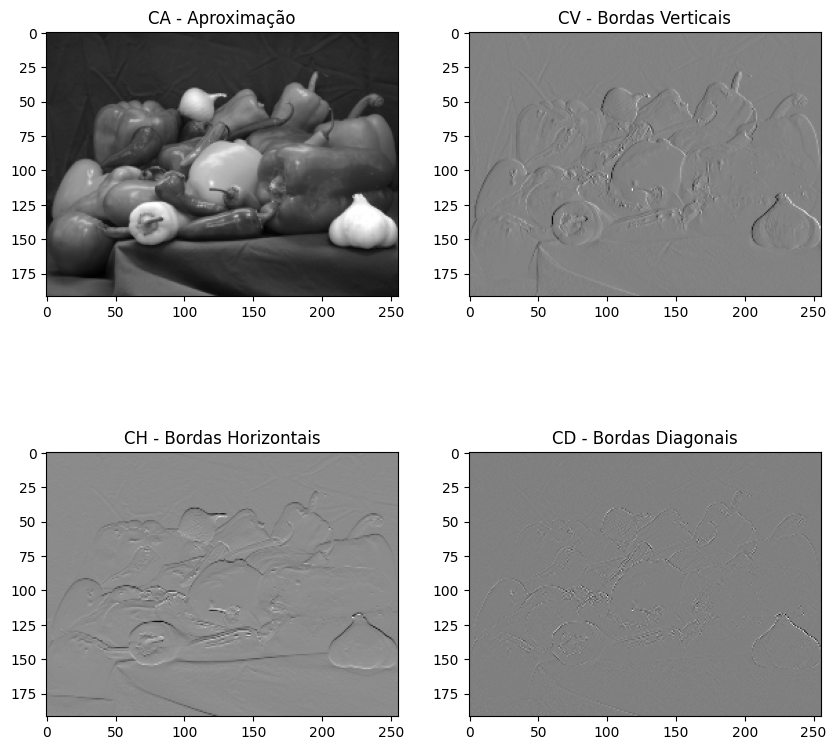

In [ ]:
img = mpimg.imread('/content/drive/MyDrive/UFABC/Codificacaosinais/Lab5/peppers.png')

img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)


coefs2 = pywt.dwt2(img_gray,'haar', mode='periodization')  #1 nível de DWT
(cA, (cH, cV, cD)) = coefs2 #Separando os coeficientes
imgr = pywt.idwt2(coefs2, 'haar', mode = 'periodization')  #1 nível de IDWT

plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(cA,'gray'); plt.title("CA - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV,'gray'); plt.title("CV - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH,'gray'); plt.title("CH - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD,'gray'); plt.title("CD - Bordas Diagonais")


C.1 Cálculo do Erro Quadrático Médio (MSE) e da Relação Sinal Ruído de Pico (PSNR)

a) A MSE é obtida calculando somando-se o erro quadrático de reconstrução pixel a pixel entre a Imagem Original (O) da Reconstruída (R) e normalizando pela dimensão (LxA) da imagem:

$ MSE = \frac{1}{LA}{\sum_{i=0}^L}{\sum_{j=0}^A [O(i,j) - R(i,j)]^2}$

b) A SNR de pico (PSNR) é definida para cada plano componente da imagem como:

$ PSNR = 10.log_{10} \left( \frac{{MAX_I}^2}{MSE} \right) $

sendo $MAX_I$ o valor máximo do pixel, que para 8 bits equivale a 255, logo:

$ PSNR = 20.log_{10}(255) - 10.log_{10} (MSE) $

OBS.: Para uma imagem RGB, $ MSE = MSE_R + MSE_G + MSE_B $, sendo similar definiação para YCrCb e HSV


MSE_Y = 1.62e-13
PSNR_Luma = 176.03 dB


Text(0.5, 1.0, 'Imagem Reconstruída de Luminância (Y) com PSNR = 176 dB')

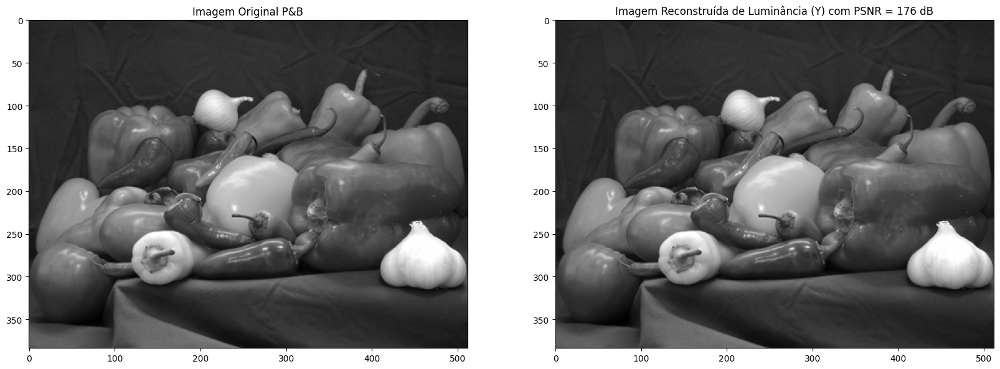

In [ ]:
# Calculo da MSE P&B
A, L, Camadas = img.shape
dif = img_gray - imgr
MSE_gray = np.sum(np.matmul(dif,np.transpose(dif)))/(A*L)
print("MSE_Y = {:.2e}".format(MSE_gray))
PSNR_Y = 20*np.log10(255) - 10*np.log10(MSE_gray)
print("PSNR_Luma = {:.2f} dB".format(PSNR_Y))
plt.figure(figsize=(20,10))
infograf = "Imagem Reconstruída de Luminância (Y) com PSNR = " + str(np.uint8(PSNR_Y)) + ' dB'
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title("Imagem Original P&B")
plt.subplot(1,2,2); plt.imshow(imgr,'gray'); plt.title(infograf)

D. Teste das Funções de Multiresolução wavedec2() e waverec2()

Text(0.5, 1.0, 'Imagem Reconstruída')

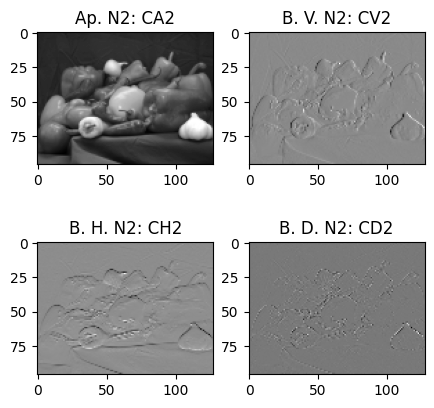

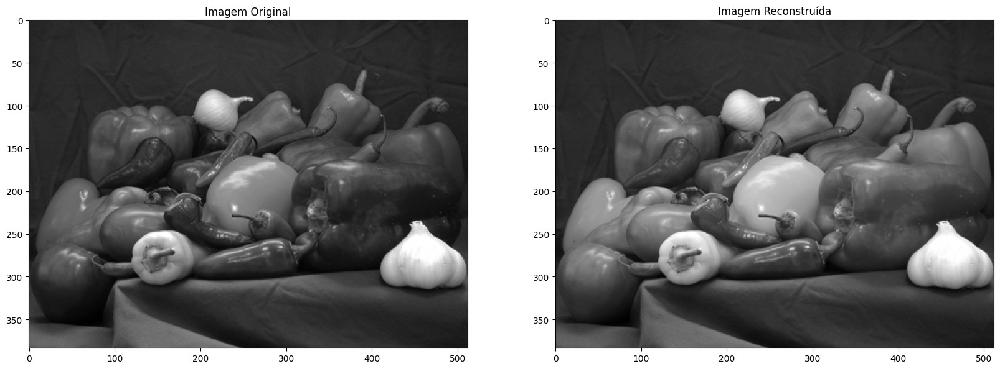

In [ ]:
C = pywt.wavedec2(img_gray,'haar', mode = 'symmetric', level=2) # Dois níveis de decomposição DWT
imgr2 = pywt.waverec2(C, 'haar', mode = 'symmetric') # Dois níveis de IDWT

# Para extrair os coeficientes de cada nível
cA2 = C[0]  # Coeficientes de Aproximação nível 2
(cH1, cV1, cD1) = C[-1] # Coeficientes de Detalhes nível 1
(cH2, cV2, cD2) = C[-2] # Coeficientes de Detalhes nível 2

# Imagem Original
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Plot dos coeficientes do nível 2
plt.figure(figsize=(5,5))
plt.subplot(2,2,1)
plt.imshow(cA2, 'gray'); plt.title('Ap. N2: CA2')
plt.subplot(2,2,2)
plt.imshow(cV2, 'gray'); plt.title('B. V. N2: CV2')
plt.subplot(2,2,3)
plt.imshow(cH2, 'gray'); plt.title('B. H. N2: CH2')
plt.subplot(2,2,4)
plt.imshow(cD2, 'gray'); plt.title('B. D. N2: CD2')

# Plot Original e Reconstrução
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title('Imagem Original')
plt.subplot(1,2,2); plt.imshow(imgr2,'gray'); plt.title('Imagem Reconstruída')


E. Efetuar uma "Montagem" com wavedec2() e wavedecn()

1º Nível

In [ ]:
CV1 = cV1.copy()
CH1 = cH1.copy()
CD1 = cD1.copy()


2º Nível

In [ ]:
CA2 = cA2.copy()
CH2 = cH2.copy()
CV2 = cV2.copy()
CD2 = cD2.copy()
# Matriz Final Completa
CA1 = np.bmat([[CA2,CV2],[CH2,CD2]])
CC = np.bmat([[CA1,CV1],[CH1,CD1]])


Text(0.5, 1.0, 'Codificação de Imagem em multinível com função wavedec2()')

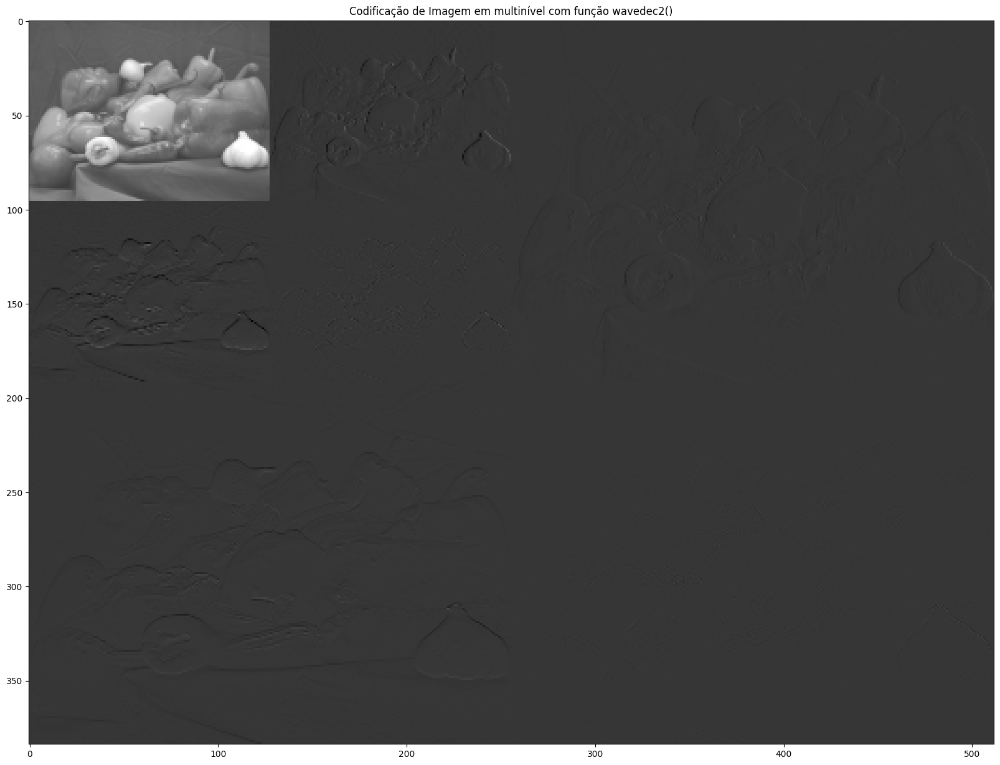

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(CC,'gray')
plt.title('Codificação de Imagem em multinível com função wavedec2()')

F. Reconstrução de Imagem Colorida

In [ ]:
# Imagem Original

plt.figure(figsize=(20,20))
plt.imshow(img); plt.title("Imagem Original")

# Codificação por planos de cores
# Plano Vermelho
coefs_R = pywt.dwt2(img[:,:,0],'haar', mode='periodization')  #1 nível de DWT R
(cA_R, (cH_R, cV_R, cD_R)) = coefs_R #Separando os coeficientes
cr_R = pywt.idwt2(coefs_R, 'haar', mode = 'periodization')  #1 nível de IDWT R

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_R,'Reds_r'); plt.title("CA_Red - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_R,'Reds_r'); plt.title("CV_Red - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_R,'Reds_r'); plt.title("CH_Red - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_R,'Reds_r'); plt.title("CD_Red - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_R, 'Reds_r'); plt.title("Imagem Reconstruída Red")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Plano Verde
coefs_G = pywt.dwt2(img[:,:,1],'haar', mode='periodization')  #1 nível de DWT G
(cA_G, (cH_G, cV_G, cD_G)) = coefs_G #Separando os coeficientes
cr_G = pywt.idwt2(coefs_G, 'haar', mode = 'periodization')  #1 nível de IDWT G

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_G,'Greens_r'); plt.title("CA_Green - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_G,'Greens_r'); plt.title("CV_Green - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_G,'Greens_r'); plt.title("CH_Green - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_G,'Greens_r'); plt.title("CD_Green - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_G, 'Greens_r'); plt.title("Imagem Reconstruída Green")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Plano Azul
coefs_B = pywt.dwt2(img[:,:,2],'haar', mode='periodization')  #1 nível de DWT B
(cA_B, (cH_B, cV_B, cD_B)) = coefs_B #Separando os coeficientes
cr_B = pywt.idwt2(coefs_B, 'haar', mode = 'periodization')  #1 nível de IDWT B

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_B,'Blues_r'); plt.title("CA_Blue - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_B,'Blues_r'); plt.title("CV_Blue - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_B,'Blues_r'); plt.title("CH_Blue - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_B,'Blues_r'); plt.title("CD_Blue - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_B, 'Blues_r'); plt.title("Imagem Reconstruída Blue")

Output hidden; open in https://colab.research.google.com to view.

Text(0.5, 1.0, 'Imagem Reconstruída DWT/IDWT Nível 1')

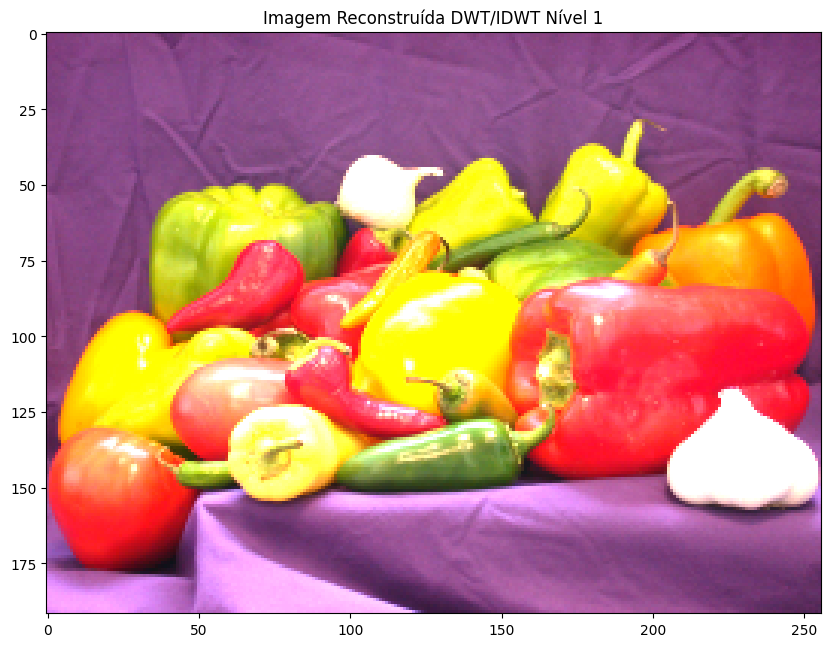

In [ ]:
# Reconstrução Nível 1 Colorida
A1, L1 = cA_R.shape
imgrec1 = np.zeros((A1,L1,3))
imgrec1[:,:,0] = cA_R.copy()
imgrec1[:,:,1] = cA_G.copy()
imgrec1[:,:,2] = cA_B.copy()
plt.figure(figsize=(10,10))
plt.imshow(imgrec1); plt.title("Imagem Reconstruída DWT/IDWT Nível 1")


G. Salvando as Aproximações e depois fazendo download dos arquivos, calcular a taxa de compressão com o original

In [ ]:
# obtenha aproximação de NÍVEL 1 e converte para inteiro
C1 = pywt.wavedec2(img_gray,'haar', mode = 'symmetric', level=1) # Um nível de decomposição DWT
CA1_ = 255 * C1[0] / np.abs(C1[0]).max()
CA1_ = CA1_.astype(int)

# aproximação de NÍVEL 2 - ja´obtido no item (D) e converte para inteiro
CA2_ = 255 * cA2 / np.abs(cA2).max()
CA2_ = CA2_.astype(int)

# Salva no drive
cv.imwrite('drive/My Drive/Colab Notebooks/peppers_DWT_N1_Y.bmp', CA1_) # Aproximação Nível 1 só Y
cv.imwrite('drive/My Drive/Colab Notebooks/peppers_DWT_N2_Y.bmp', CA2_) # Aproximação Nível 2 só Y


True

In [ ]:
!ls -l "drive/My Drive/Colab Notebooks"

total 208
-rw------- 1 root root 147510 Nov  7 00:44 peppers_DWT_N1_colorida.bmp
-rw------- 1 root root  50230 Nov 21 11:36 peppers_DWT_N1_Y.bmp
-rw------- 1 root root  13366 Nov 21 11:36 peppers_DWT_N2_Y.bmp


In [ ]:
import os
tamanho = os.path.getsize('drive/My Drive/Colab Notebooks/peppers_DWT_N1_Y.bmp')
print(tamanho)

50230


H. Gravando o Arquivo Codificado DWT/IDWT nível 1 Colorido, calcular a taxa de compressão com o original

In [ ]:
# Aproximação Nível 1 Colorida
# converte RGB para BGR e converte para inteiro
imgrec1_ = np.zeros((A1,L1,3))
imgrec1_[:,:,0] = imgrec1[:,:,2]
imgrec1_[:,:,1] = imgrec1[:,:,1]
imgrec1_[:,:,2] = imgrec1[:,:,0]
imgrec1_ = ( 255 * imgrec1_ / np.abs(imgrec1_).max() ).astype(int)

# Salva no drive
cv.imwrite('drive/My Drive/Colab Notebooks/peppers_DWT_N1_colorida.bmp', imgrec1_) # Gravando Aproximação Nível 1 Colorida

True

I. Reconstrução da Imagem colorida e Cálculo da MSE de cada plano de cor e da PSNR total

MSE_Red= 4.28e-13  MSE_Green= 1.12e-13  MSE_Blue= 8.70e-14
PSNR total = 170.16 dB


Text(0.5, 1.0, 'Imagem Reconstruída com PSNR total = 170 dB')

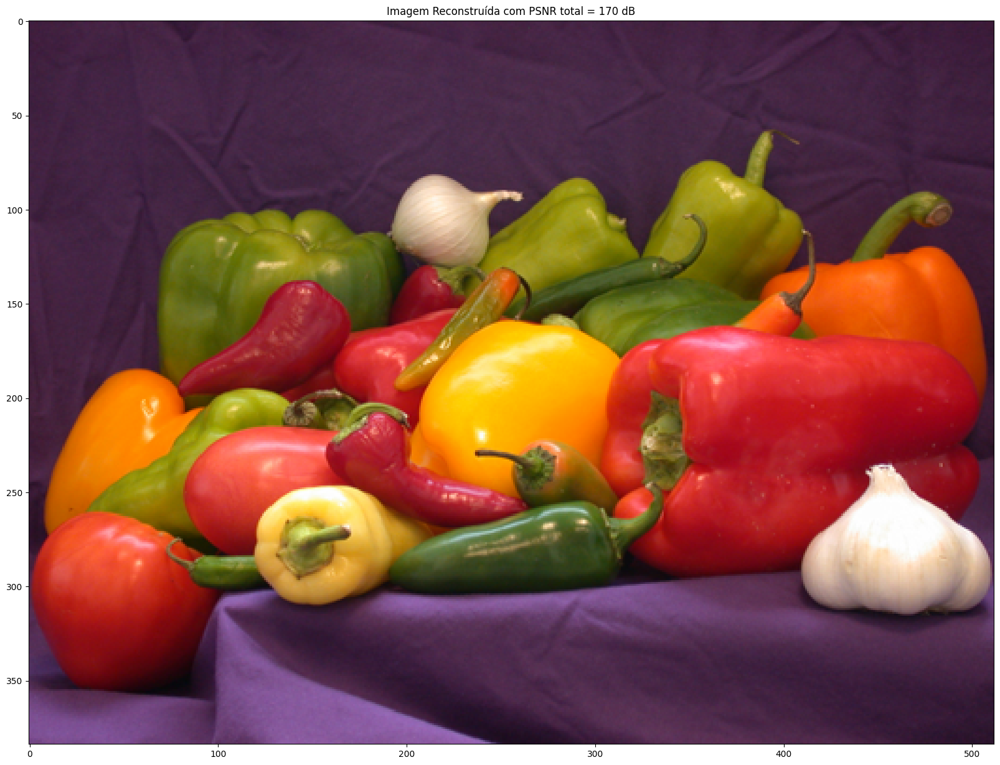

In [ ]:
# Reconstrução Colorida Original
A,L = imgr2.shape
imgrec = np.zeros((A,L,3))
imgrec[:,:,0] = cr_R.copy()
imgrec[:,:,1] = cr_G.copy()
imgrec[:,:,2] = cr_B.copy()

# Calculo do MSE colorida
dif2 = img - imgrec
MSE_R = np.sum(np.matmul(dif2[:,:,0],np.transpose(dif2[:,:,0])))/(A*L) # Erro Quadrático Médio plano R
MSE_G = np.sum(np.matmul(dif2[:,:,1],np.transpose(dif2[:,:,1])))/(A*L) # Erro Quadrático Médio plano G
MSE_B = np.sum(np.matmul(dif2[:,:,2],np.transpose(dif2[:,:,2])))/(A*L) # Erro Quadrático Médio plano B
print("MSE_Red= {:.2e}".format(MSE_R), " MSE_Green= {:.2e}".format(MSE_G), " MSE_Blue= {:.2e}".format(MSE_B))

# Cálculo da SNR de pico colorida (PSNR), 3 camadas R, G e B
PSNR = 20*np.log10(255) - 10*np.log10(MSE_R + MSE_G + MSE_B)
print("PSNR total = {:.2f} dB".format(PSNR))

plt.figure(figsize=(20,20))
infograf2 = "Imagem Reconstruída com PSNR total = " + str(np.uint8(PSNR)) + ' dB'
plt.imshow(imgrec); plt.title(infograf2)

# I. Variando nível e os componentes da reconstrução DWT
1.  Efetue o mesmo procedimento para um nível a mais de codificação, reconstruindo a peppers a cores, eliminando CH, CV e CD. Calcule a PSNR e a taxa de compressão do arquivo final reconstruído.
2.  Elimine progressivamente CD, depois CD e CV, e por fim CH, CV e CD. Calcule a PSNR e a taxa de compressão do arquivo final reconstruído em cada caso.  

**Reconstrução Nivel 2**

In [ ]:
C2 = pywt.wavedec2(img_gray, 'haar', mode='symmetric', level=3) # Três níveis de decomposição DWT
imgr3 = pywt.waverec2(C2, 'haar', mode='symmetric') # Três níveis de IDWT

In [ ]:
# Para extrair os coeficientes de cada nível
cA3 = C2[0]
(cH1, cV1, cD1) = C2[-1]
(cH2, cV2, cD2) = C2[-2]
(cH3, cV3, cD3) = C2[-3]

Text(0.5, 1.0, 'Imagem Reconstruída')

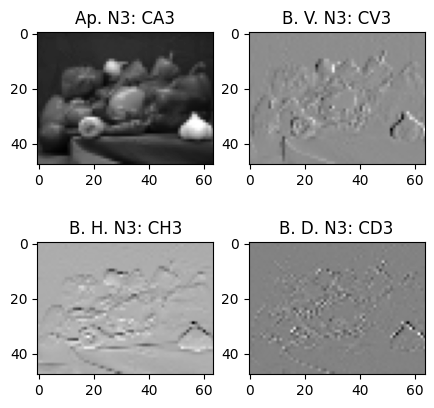

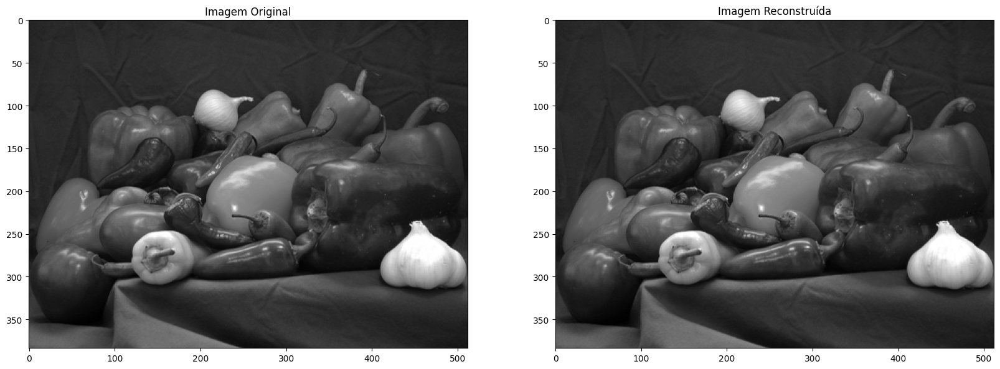

In [ ]:
# Imagem Original
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Plot dos coeficientes do nível 3
plt.figure(figsize=(5,5))
plt.subplot(2,2,1)
plt.imshow(cA3, 'gray'); plt.title('Ap. N3: CA3')
plt.subplot(2,2,2)
plt.imshow(cV3, 'gray'); plt.title('B. V. N3: CV3')
plt.subplot(2,2,3)
plt.imshow(cH3, 'gray'); plt.title('B. H. N3: CH3')
plt.subplot(2,2,4)
plt.imshow(cD3, 'gray'); plt.title('B. D. N3: CD3')

# Plot Original e Reconstrução
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title('Imagem Original')
plt.subplot(1,2,2); plt.imshow(imgr3,'gray'); plt.title('Imagem Reconstruída')

In [ ]:
CV1 = cV1.copy()
CH1 = cH1.copy()
CD1 = cD1.copy()

In [ ]:
CH2 = cH2.copy()
CV2 = cV2.copy()
CD2 = cD2.copy()

In [ ]:
CA3 = cA3.copy()
CH3 = cH3.copy()
CV3 = cV3.copy()
CD3 = cD3.copy()
# Matriz Final Completa
CA2 = np.bmat([[CA3, CV3],[CH3,CD3]])
CA1 = np.bmat([[CA2,CV2],[CH2,CD2]])
CC = np.bmat([[CA1,CV1],[CH1,CD1]])

Text(0.5, 1.0, 'Codificação de Imagem em multinível com função wavedec2()')

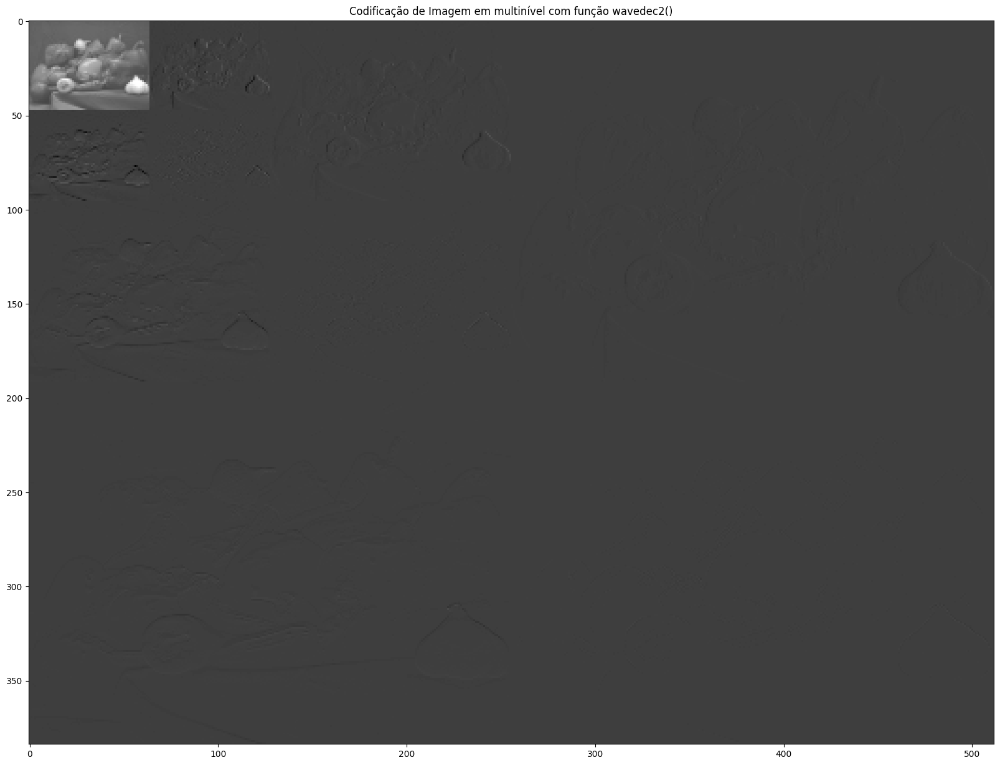

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(CC,'gray')
plt.title('Codificação de Imagem em multinível com função wavedec2()')

F. Reconstrução de Imagem Colorida

In [ ]:

coeffs3 = [CA3]


coeffs2 = [CA2]


coeffs1 = [CA1]


imgr3 = pywt.waverec2(coeffs3, 'haar', mode='symmetric')
imgr2 = pywt.waverec2(coeffs2, 'haar', mode='symmetric')
imgr1 = pywt.waverec2(coeffs1, 'haar', mode='symmetric')



In [ ]:
MSE_R2 = np.sum(np.matmul(dif2[:,:,0], np.transpose(dif2[:,:,0])))/(A*L)
MSE_G2 = np.sum(np.matmul(dif2[:,:,1], np.transpose(dif2[:,:,1])))/(A*L)
MSE_B2 = np.sum(np.matmul(dif2[:,:,2], np.transpose(dif2[:,:,2])))/(A*L)

In [ ]:
PSNR_R2 = 20*np.log10(255) - 10*np.log10(MSE_R2)
PSNR_G2 = 20*np.log10(255) - 10*np.log10(MSE_G2)
PSNR_B2 = 20*np.log10(255) - 10*np.log10(MSE_B2)


In [ ]:
PSNR_total2 = 20*np.log10(255) - 10*np.log10(MSE_R2 + MSE_G2 + MSE_B2)

In [ ]:
compression_rate2 = (os.path.getsize('drive/My Drive/Colab Notebooks/peppers_DWT_N1_Y.bmp')) / (os.path.getsize('drive/My Drive/Colab Notebooks/peppers_DWT_N1_colorida.bmp'))

In [ ]:
print("PSNR Vermelho sem CH, CV, and CD = {:.2f} dB".format(PSNR_R2))
print("PSNR Verde sem CH, CV, and CD = {:.2f} dB".format(PSNR_G2))
print("PSNR Azul sem CH, CV, and CD = {:.2f} dB".format(PSNR_B2))
print("PSNR Total sem CH, CV, and CD = {:.2f} dB".format(PSNR_total2))
print("Taxa de compressão sem CH, CV, and CD = {:.2f}".format(compression_rate2))

PSNR Vermelho sem CH, CV, and CD = 171.82 dB
PSNR Verde sem CH, CV, and CD = 177.65 dB
PSNR Azul sem CH, CV, and CD = 178.74 dB
PSNR Total sem CH, CV, and CD = 170.16 dB
Taxa de compressão sem CH, CV, and CD = 0.34


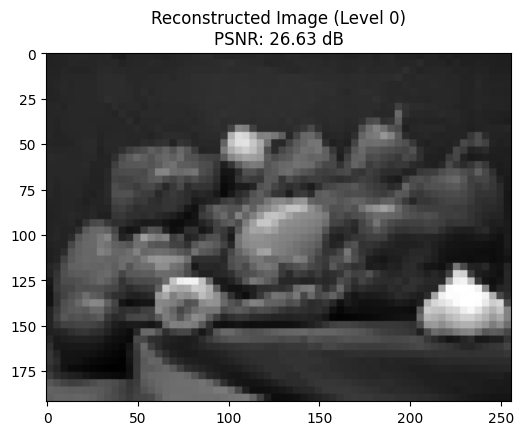

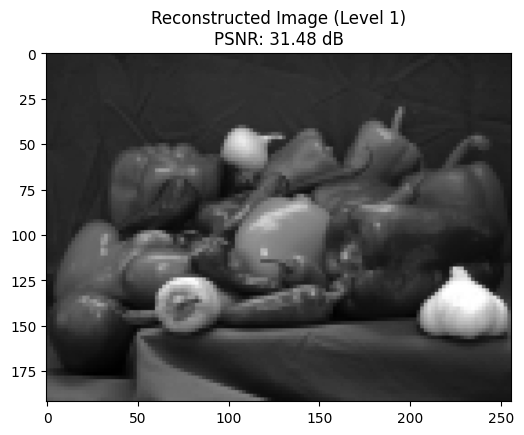

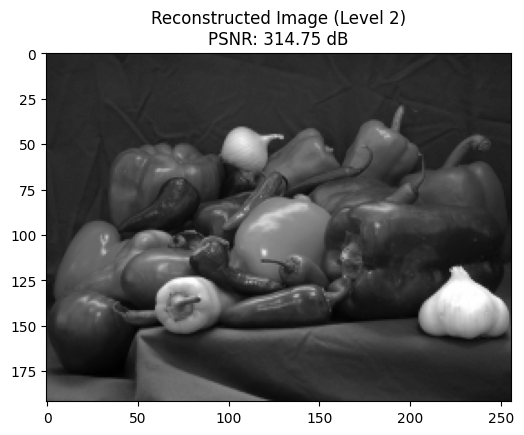

In [ ]:
# Carrega a imagem
img = cv.imread('drive/MyDrive/Colab Notebooks/peppers_DWT_N1_Y.bmp', cv.IMREAD_GRAYSCALE)

# Checa se a imagem foi carregada
if img is None:
    print("Erro")
else:
    # DWT 2º nível
    coeffs = pywt.wavedec2(img, 'haar', level=2)

    for i in range(3):
        coeffs_copy = [c if j <= i else (np.zeros_like(c[0]), np.zeros_like(c[1]), np.zeros_like(c[2])) for j, c in enumerate(coeffs)]

        # Reconstroi a imagem
        reconstructed_img = pywt.waverec2(coeffs_copy, 'haar')

        # CAlcula MSE e PSNR
        MSE = np.mean((img - reconstructed_img) ** 2)
        PSNR = 20 * np.log10(255) - 10 * np.log10(MSE)

        # Mostra os resultados
        plt.figure(figsize=(6, 6))
        plt.imshow(reconstructed_img, cmap='gray')
        plt.title(f'Reconstructed Image (Level {i})\nPSNR: {PSNR:.2f} dB')
        plt.show()



# J. Cada um deve repetir todos os passos para a sua foto individual

Text(0.5, 1.0, 'CD - Bordas Diagonais')

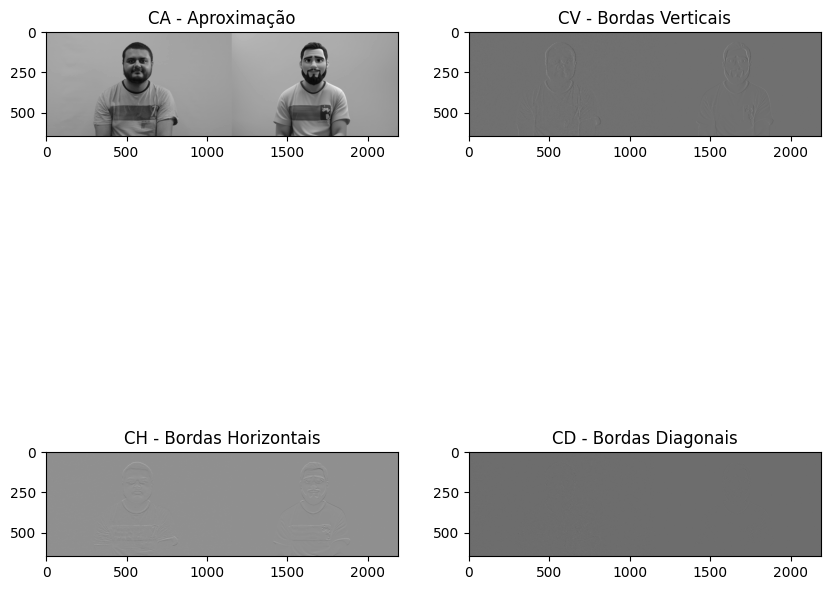

In [ ]:
img = mpimg.imread('/content/drive/MyDrive/UFABC/Codificacaosinais/Lab5/Foto_Jonnathas.jpg')

img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)


coefs2 = pywt.dwt2(img_gray,'haar', mode='periodization')  #1 nível de DWT
(cA, (cH, cV, cD)) = coefs2 #Separando os coeficientes
imgr = pywt.idwt2(coefs2, 'haar', mode = 'periodization')  #1 nível de IDWT

plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(cA,'gray'); plt.title("CA - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV,'gray'); plt.title("CV - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH,'gray'); plt.title("CH - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD,'gray'); plt.title("CD - Bordas Diagonais")

MSE_Y = 1.66e-24
PSNR_Luma = 285.92 dB


Text(0.5, 1.0, 'Imagem Reconstruída de Luminância (Y) com PSNR = 29 dB')

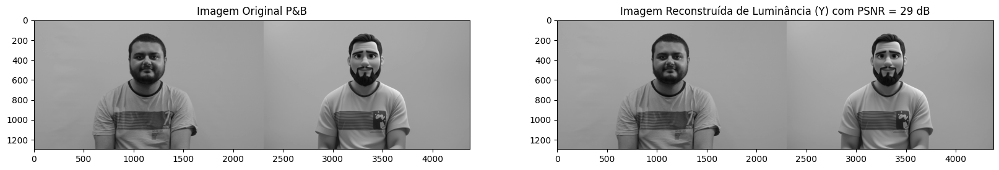

In [ ]:
A, L, Camadas = img.shape
dif = img_gray - imgr
MSE_gray = np.sum(np.matmul(dif,np.transpose(dif)))/(A*L)
print("MSE_Y = {:.2e}".format(MSE_gray))
PSNR_Y = 20*np.log10(255) - 10*np.log10(MSE_gray)
print("PSNR_Luma = {:.2f} dB".format(PSNR_Y))
plt.figure(figsize=(20,10))
infograf = "Imagem Reconstruída de Luminância (Y) com PSNR = " + str(np.uint8(PSNR_Y)) + ' dB'
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title("Imagem Original P&B")
plt.subplot(1,2,2); plt.imshow(imgr,'gray'); plt.title(infograf)

Text(0.5, 1.0, 'Imagem Reconstruída')

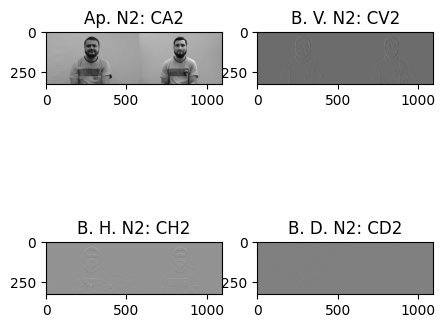

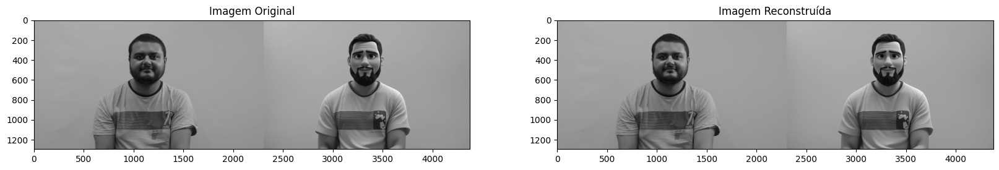

In [ ]:
C = pywt.wavedec2(img_gray,'haar', mode = 'symmetric', level=2) # Dois níveis de decomposição DWT
imgr2 = pywt.waverec2(C, 'haar', mode = 'symmetric') # Dois níveis de IDWT

# Para extrair os coeficientes de cada nível
cA2 = C[0]  # Coeficientes de Aproximação nível 2
(cH1, cV1, cD1) = C[-1] # Coeficientes de Detalhes nível 1
(cH2, cV2, cD2) = C[-2] # Coeficientes de Detalhes nível 2

# Imagem Original
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Plot dos coeficientes do nível 2
plt.figure(figsize=(5,5))
plt.subplot(2,2,1)
plt.imshow(cA2, 'gray'); plt.title('Ap. N2: CA2')
plt.subplot(2,2,2)
plt.imshow(cV2, 'gray'); plt.title('B. V. N2: CV2')
plt.subplot(2,2,3)
plt.imshow(cH2, 'gray'); plt.title('B. H. N2: CH2')
plt.subplot(2,2,4)
plt.imshow(cD2, 'gray'); plt.title('B. D. N2: CD2')

# Plot Original e Reconstrução
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title('Imagem Original')
plt.subplot(1,2,2); plt.imshow(imgr2,'gray'); plt.title('Imagem Reconstruída')

In [ ]:
CV1 = cV1.copy()
CH1 = cH1.copy()
CD1 = cD1.copy()

Shapes before concatenation:
CA2: (324, 1095)
CV2: (324, 1095)
CH2: (324, 1095)
CD2: (324, 1095)
CA1: (648, 2190)
CV1: (648, 2189)
CH1: (648, 2189)
CD1: (648, 2189)


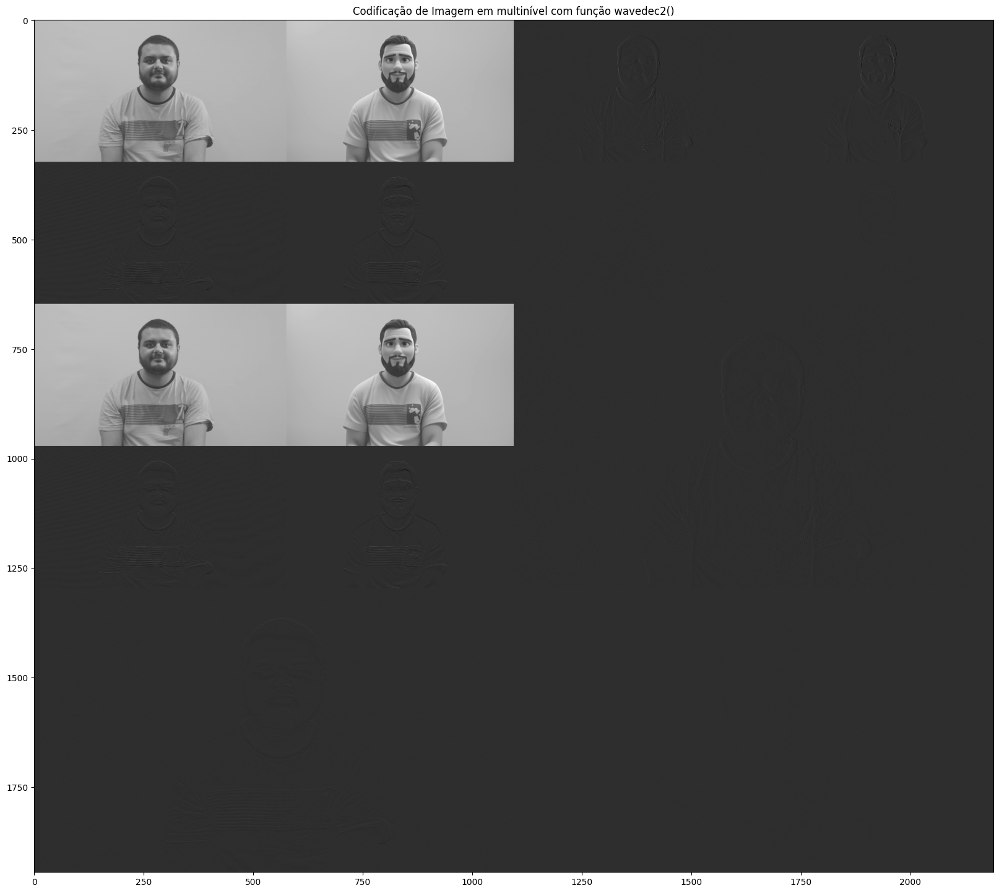

In [ ]:
CA2 = cA2.copy()
CH2 = cH2.copy()
CV2 = cV2.copy()
CD2 = cD2.copy()
# Matriz Final Completa
CA1 = np.bmat([[CA2,CV2],[CH2,CD2]])


# Checando antes de concatenar
print("Shapes before concatenation:")
print("CA2:", CA2.shape)
print("CV2:", CV2.shape)
print("CH2:", CH2.shape)
print("CD2:", CD2.shape)
print("CA1:", CA1.shape)
print("CV1:", CV1.shape)
print("CH1:", CH1.shape)
print("CD1:", CD1.shape)

# Certificando que os arrays possuem a mesma dimensão
num_cols = min(CA2.shape[1], CV2.shape[1], CH2.shape[1], CD2.shape[1], CA1.shape[1], CV1.shape[1], CH1.shape[1], CD1.shape[1])

# Ajustando o número de colunas
CA2_combined = CA2[:, :num_cols]
CV2_combined = CV2[:, :num_cols]
CH2_combined = CH2[:, :num_cols]
CD2_combined = CD2[:, :num_cols]
CA1_combined = CA1[:, :num_cols]
CV1_combined = CV1[:, :num_cols]
CH1_combined = CH1[:, :num_cols]
CD1_combined = CD1[:, :num_cols]

# Concatenando os arrays
CC = np.vstack((np.hstack((CA2_combined, CV2_combined)), np.hstack((CH2_combined, CD2_combined))))
CA1_combined = np.vstack((np.hstack((CA1_combined, CV1_combined)), np.hstack((CH1_combined, CD1_combined))))

# Mostrando a imagem
plt.figure(figsize=(20, 20))
plt.imshow(np.vstack((CC, CA1_combined)), 'gray')
plt.title('Codificação de Imagem em multinível com função wavedec2()')
plt.show()


In [ ]:
# Imagem Original

plt.figure(figsize=(20,20))
plt.imshow(img); plt.title("Imagem Original")

# Codificação por planos de cores
# Plano Vermelho
coefs_R = pywt.dwt2(img[:,:,0],'haar', mode='periodization')  #1 nível de DWT R
(cA_R, (cH_R, cV_R, cD_R)) = coefs_R #Separando os coeficientes
cr_R = pywt.idwt2(coefs_R, 'haar', mode = 'periodization')  #1 nível de IDWT R

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_R,'Reds_r'); plt.title("CA_Red - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_R,'Reds_r'); plt.title("CV_Red - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_R,'Reds_r'); plt.title("CH_Red - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_R,'Reds_r'); plt.title("CD_Red - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_R, 'Reds_r'); plt.title("Imagem Reconstruída Red")

Output hidden; open in https://colab.research.google.com to view.

Text(0.5, 1.0, 'Imagem Reconstruída Green')

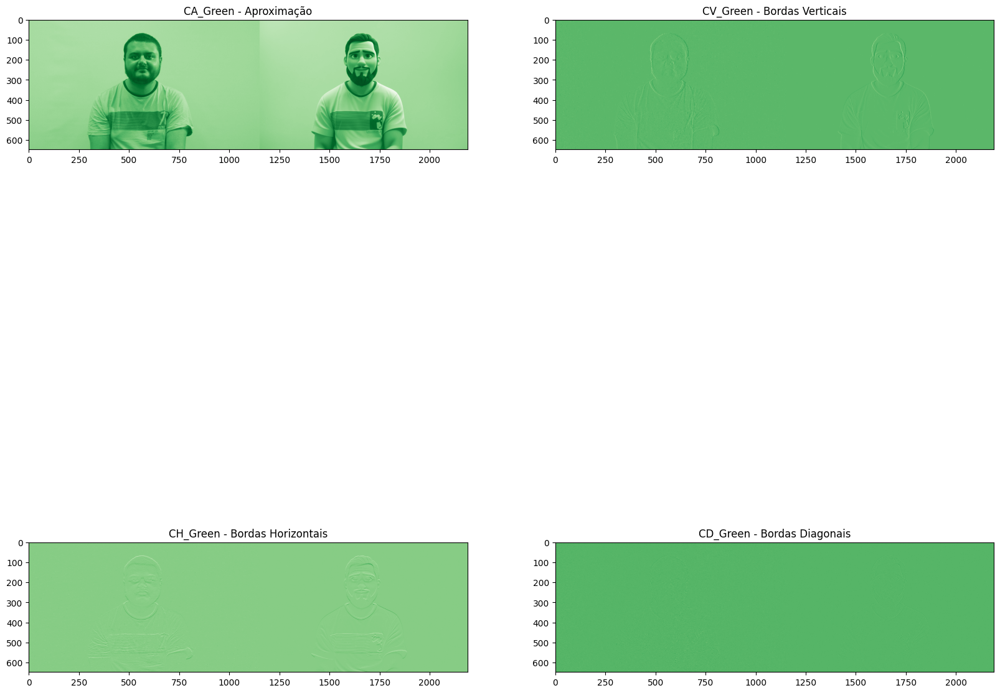

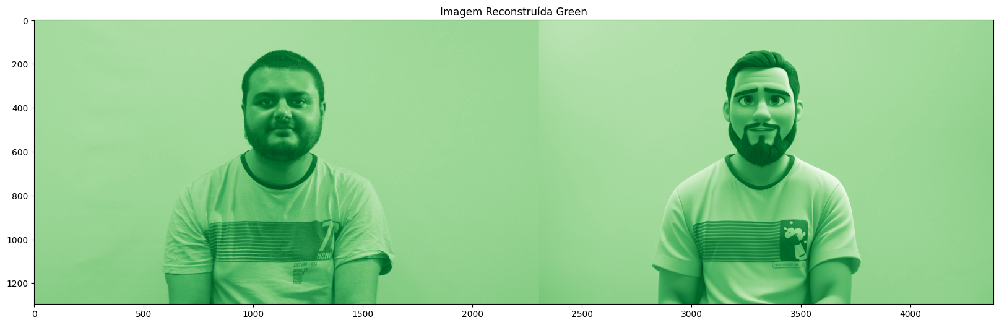

In [ ]:
# Plano Verde
coefs_G = pywt.dwt2(img[:,:,1],'haar', mode='periodization')  #1 nível de DWT G
(cA_G, (cH_G, cV_G, cD_G)) = coefs_G #Separando os coeficientes
cr_G = pywt.idwt2(coefs_G, 'haar', mode = 'periodization')  #1 nível de IDWT G

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_G,'Greens_r'); plt.title("CA_Green - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_G,'Greens_r'); plt.title("CV_Green - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_G,'Greens_r'); plt.title("CH_Green - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_G,'Greens_r'); plt.title("CD_Green - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_G, 'Greens_r'); plt.title("Imagem Reconstruída Green")

Text(0.5, 1.0, 'Imagem Reconstruída Blue')

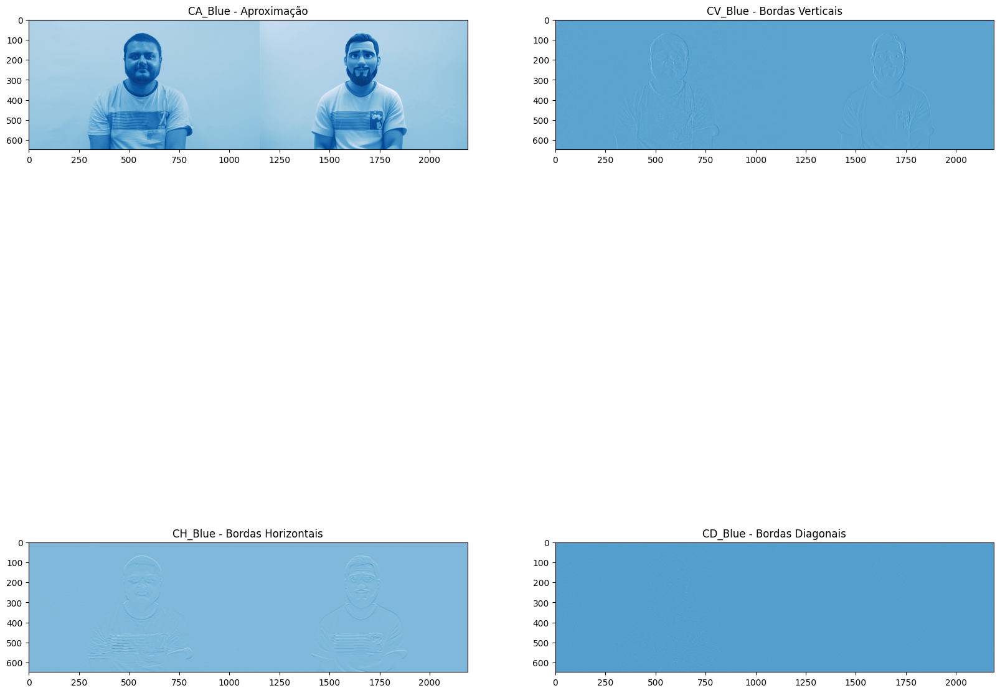

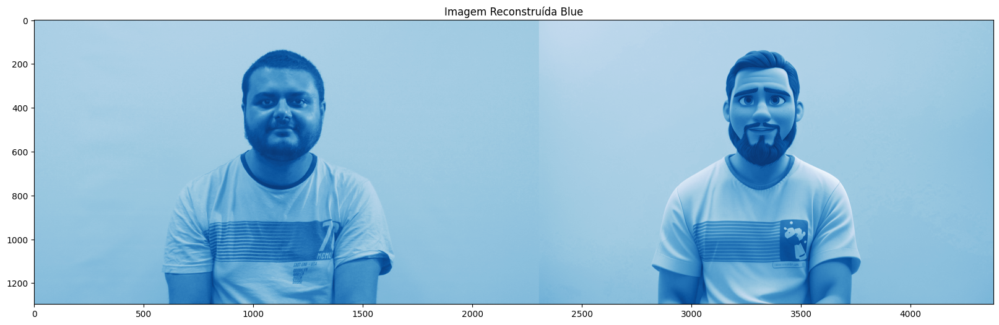

In [ ]:
# Plano Azul
coefs_B = pywt.dwt2(img[:,:,2],'haar', mode='periodization')  #1 nível de DWT B
(cA_B, (cH_B, cV_B, cD_B)) = coefs_B #Separando os coeficientes
cr_B = pywt.idwt2(coefs_B, 'haar', mode = 'periodization')  #1 nível de IDWT B

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(cA_B,'Blues_r'); plt.title("CA_Blue - Aproximação")
plt.subplot(2,2,2)
plt.imshow(cV_B,'Blues_r'); plt.title("CV_Blue - Bordas Verticais")
plt.subplot(2,2,3)
plt.imshow(cH_B,'Blues_r'); plt.title("CH_Blue - Bordas Horizontais")
plt.subplot(2,2,4)
plt.imshow(cD_B,'Blues_r'); plt.title("CD_Blue - Bordas Diagonais")

plt.figure(figsize=(20,20))
plt.imshow(cr_B, 'Blues_r'); plt.title("Imagem Reconstruída Blue")

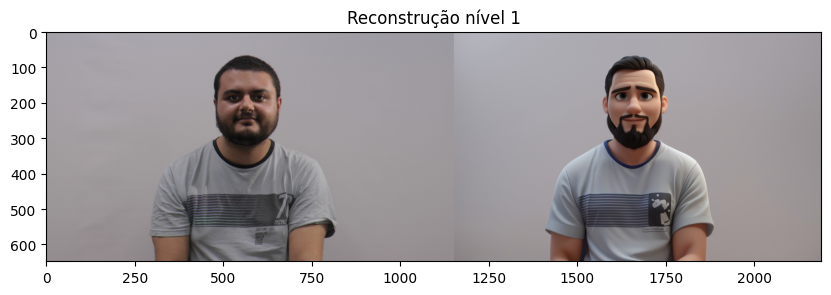

In [ ]:
# Reconstrução Nível 1 Colorida
A1, L1 = cA_R.shape
imgrec1 = np.zeros((A1,L1,3))
imgrec1[:,:,0] = cA_R.copy()
imgrec1[:,:,1] = cA_G.copy()
imgrec1[:,:,2] = cA_B.copy()

# Normalizando a imgrec1
imgrec1_normalized = (imgrec1 - np.min(imgrec1)) / (np.max(imgrec1) - np.min(imgrec1))

plt.figure(figsize=(10, 10))
plt.imshow(imgrec1_normalized)
plt.title("Reconstrução nível 1")
plt.show()

In [ ]:
# obtenha aproximação de NÍVEL 1 e converte para inteiro
C1 = pywt.wavedec2(img_gray,'haar', mode = 'symmetric', level=1) # Um nível de decomposição DWT
CA1_ = 255 * C1[0] / np.abs(C1[0]).max()
CA1_ = CA1_.astype(int)

# aproximação de NÍVEL 2 - ja´obtido no item (D) e converte para inteiro
CA2_ = 255 * cA2 / np.abs(cA2).max()
CA2_ = CA2_.astype(int)

# Salva no drive
cv.imwrite('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N1_Y.bmp', CA1_) # Aproximação Nível 1 só Y
cv.imwrite('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N2_Y.bmp', CA2_) # Aproximação Nível 2 só Y

!ls -l "drive/My Drive/Colab Notebooks"

import os
tamanho = os.path.getsize('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N1_Y.bmp')
print(tamanho)

total 1944
-rw------- 1 root root 1421494 Nov 21 12:33 Jonnathas_DWT_N1_Y.bmp
-rw------- 1 root root  356182 Nov 21 12:33 Jonnathas_DWT_N2_Y.bmp
-rw------- 1 root root  147510 Nov 21 11:36 peppers_DWT_N1_colorida.bmp
-rw------- 1 root root   50230 Nov 21 11:36 peppers_DWT_N1_Y.bmp
-rw------- 1 root root   13366 Nov 21 11:36 peppers_DWT_N2_Y.bmp
1421494


In [ ]:
# Aproximação Nível 1 Colorida
# converte RGB para BGR e converte para inteiro
imgrec1_ = np.zeros((A1,L1,3))
imgrec1_[:,:,0] = imgrec1[:,:,2]
imgrec1_[:,:,1] = imgrec1[:,:,1]
imgrec1_[:,:,2] = imgrec1[:,:,0]
imgrec1_ = ( 255 * imgrec1_ / np.abs(imgrec1_).max() ).astype(int)

# Salva no drive
cv.imwrite('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N1_colorida.bmp', imgrec1_) # Gravando Aproximação Nível 1 Colorida


True

MSE_Red= 1.69e-24  MSE_Green= 1.60e-24  MSE_Blue= 1.65e-24
PSNR total = 281.20 dB


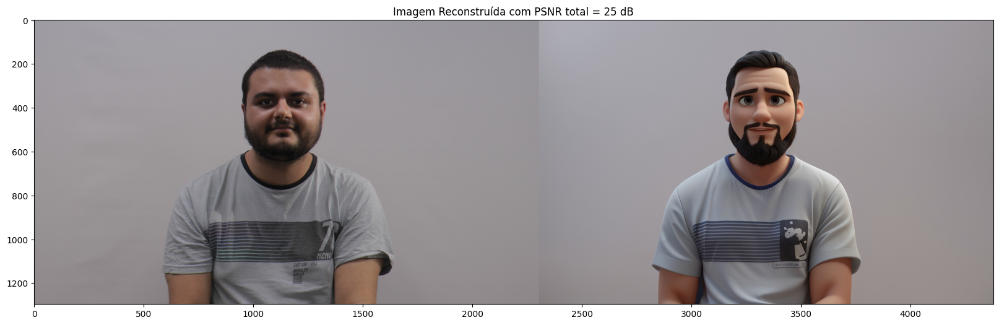

In [ ]:
# Reconstrução Colorida Original
A,L = imgr2.shape
imgrec = np.zeros((A,L,3))
imgrec[:,:,0] = cr_R.copy()
imgrec[:,:,1] = cr_G.copy()
imgrec[:,:,2] = cr_B.copy()

# Calculo do MSE colorida
dif2 = img - imgrec
MSE_R = np.sum(np.matmul(dif2[:,:,0],np.transpose(dif2[:,:,0])))/(A*L) # Erro Quadrático Médio plano R
MSE_G = np.sum(np.matmul(dif2[:,:,1],np.transpose(dif2[:,:,1])))/(A*L) # Erro Quadrático Médio plano G
MSE_B = np.sum(np.matmul(dif2[:,:,2],np.transpose(dif2[:,:,2])))/(A*L) # Erro Quadrático Médio plano B
print("MSE_Red= {:.2e}".format(MSE_R), " MSE_Green= {:.2e}".format(MSE_G), " MSE_Blue= {:.2e}".format(MSE_B))

# Cálculo da SNR de pico colorida (PSNR), 3 camadas R, G e B
PSNR = 20*np.log10(255) - 10*np.log10(MSE_R + MSE_G + MSE_B)
print("PSNR total = {:.2f} dB".format(PSNR))

imgrec_normalized = imgrec / 255.0  # Normaliza valores de pixel[0, 1]
plt.figure(figsize=(20, 20))
infograf2 = "Imagem Reconstruída com PSNR total = " + str(np.uint8(PSNR)) + ' dB'
plt.imshow(imgrec_normalized)
plt.title(infograf2)
plt.show()


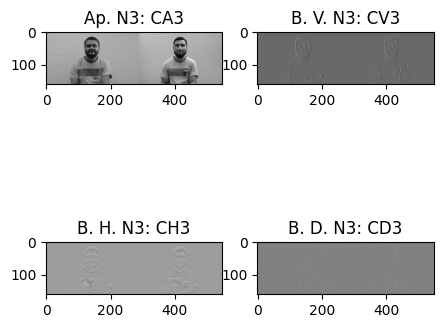

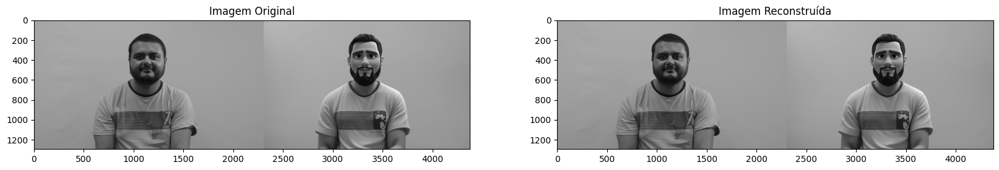

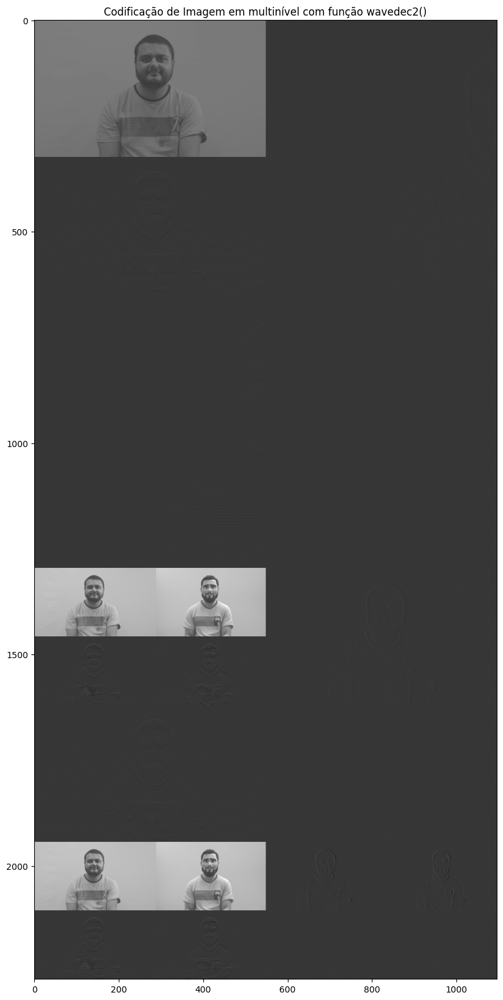

In [ ]:
C2 = pywt.wavedec2(img_gray, 'haar', mode='symmetric', level=3) # Três níveis de decomposição DWT
imgr3 = pywt.waverec2(C2, 'haar', mode='symmetric') # Três níveis de IDWT

# Para extrair os coeficientes de cada nível
cA3 = C2[0]
(cH1, cV1, cD1) = C2[-1]
(cH2, cV2, cD2) = C2[-2]
(cH3, cV3, cD3) = C2[-3]

# Imagem Original
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Plot dos coeficientes do nível 3
plt.figure(figsize=(5,5))
plt.subplot(2,2,1)
plt.imshow(cA3, 'gray'); plt.title('Ap. N3: CA3')
plt.subplot(2,2,2)
plt.imshow(cV3, 'gray'); plt.title('B. V. N3: CV3')
plt.subplot(2,2,3)
plt.imshow(cH3, 'gray'); plt.title('B. H. N3: CH3')
plt.subplot(2,2,4)
plt.imshow(cD3, 'gray'); plt.title('B. D. N3: CD3')

# Plot Original e Reconstrução
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(img_gray,'gray'); plt.title('Imagem Original')
plt.subplot(1,2,2); plt.imshow(imgr3,'gray'); plt.title('Imagem Reconstruída')

CV1 = cV1.copy()
CH1 = cH1.copy()
CD1 = cD1.copy()

CH2 = cH2.copy()
CV2 = cV2.copy()
CD2 = cD2.copy()

CA3 = cA3.copy()
CH3 = cH3.copy()
CV3 = cV3.copy()
CD3 = cD3.copy()
# Assuming cA3, cV3, cH3, cD3, cA2, cV2, cH2, cD2, cA1, cV1, cH1, cD1 have been defined previously

# Ensure all arrays have the same number of columns
num_cols = min(
    CA3.shape[1], CV3.shape[1], CH3.shape[1], CD3.shape[1],
    CA2.shape[1], CV2.shape[1], CH2.shape[1], CD2.shape[1],
    CA1.shape[1], CV1.shape[1], CH1.shape[1], CD1.shape[1]
)

# Adjust the number of columns
CA3_combined = CA3[:, :num_cols]
CV3_combined = CV3[:, :num_cols]
CH3_combined = CH3[:, :num_cols]
CD3_combined = CD3[:, :num_cols]

CA2_combined = CA2[:, :num_cols]
CV2_combined = CV2[:, :num_cols]
CH2_combined = CH2[:, :num_cols]
CD2_combined = CD2[:, :num_cols]

CA1_combined = CA1[:, :num_cols]
CV1_combined = CV1[:, :num_cols]
CH1_combined = CH1[:, :num_cols]
CD1_combined = CD1[:, :num_cols]

# Concatenate arrays using np.block
CC_upper = np.block([[CA1_combined, CV1_combined], [CH1_combined, CD1_combined]])
CA2_combined = np.block([[CA2_combined, CV2_combined], [CH2_combined, CD2_combined]])
CA3_combined = np.block([[CA3_combined, CV3_combined], [CH3_combined, CD3_combined]])

# Display the concatenated image
plt.figure(figsize=(20, 20))
plt.imshow(np.block([[CC_upper], [CA2_combined], [CA3_combined]]), 'gray')
plt.title('Codificação de Imagem em multinível com função wavedec2()')
plt.show()


In [ ]:
coeffs3 = [CA3, (None, None, None), (None, None, None)]
coeffs2 = [CA2, (None, None, None)]
coeffs1 = [CA1]

imgr3 = pywt.waverec2(coeffs3, 'haar', mode='symmetric')
imgr2 = pywt.waverec2(coeffs2, 'haar', mode='symmetric')
imgr1 = pywt.waverec2(coeffs1, 'haar', mode='symmetric')


MSE_R2 = np.sum(np.matmul(dif2[:,:,0], np.transpose(dif2[:,:,0])))/(A*L)
MSE_G2 = np.sum(np.matmul(dif2[:,:,1], np.transpose(dif2[:,:,1])))/(A*L)
MSE_B2 = np.sum(np.matmul(dif2[:,:,2], np.transpose(dif2[:,:,2])))/(A*L)

PSNR_R2 = 20*np.log10(255) - 10*np.log10(MSE_R2)
PSNR_G2 = 20*np.log10(255) - 10*np.log10(MSE_G2)
PSNR_B2 = 20*np.log10(255) - 10*np.log10(MSE_B2)

PSNR_total2 = 20*np.log10(255) - 10*np.log10(MSE_R2 + MSE_G2 + MSE_B2)

compression_rate2 = (os.path.getsize('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N1_Y.bmp')) / (os.path.getsize('drive/My Drive/Colab Notebooks/Jonnathas_DWT_N1_colorida.bmp'))

print("PSNR Vermelho sem CH, CV, and CD = {:.2f} dB".format(PSNR_R2))
print("PSNR Verde sem CH, CV, and CD = {:.2f} dB".format(PSNR_G2))
print("PSNR Azul sem CH, CV, and CD = {:.2f} dB".format(PSNR_B2))
print("PSNR Total sem CH, CV, and CD = {:.2f} dB".format(PSNR_total2))
print("Taxa de compressão sem CH, CV, and CD = {:.2f}".format(compression_rate2))

PSNR Vermelho sem CH, CV, and CD = 285.86 dB
PSNR Verde sem CH, CV, and CD = 286.10 dB
PSNR Azul sem CH, CV, and CD = 285.95 dB
PSNR Total sem CH, CV, and CD = 281.20 dB
Taxa de compressão sem CH, CV, and CD = 0.33


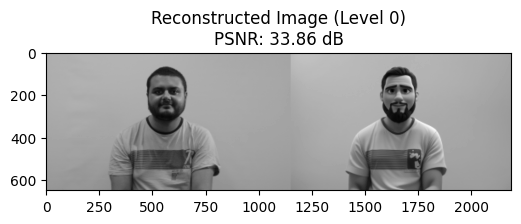

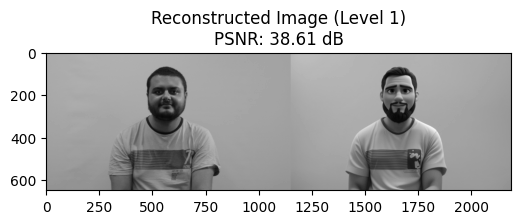

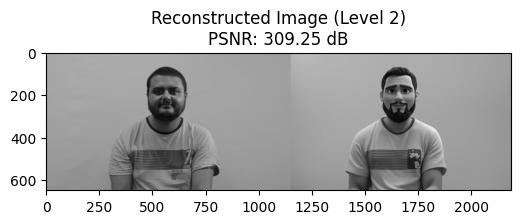

In [108]:
# Carrega a imagem
img = cv.imread('drive/MyDrive/Colab Notebooks/Jonnathas_DWT_N1_Y.bmp', cv.IMREAD_GRAYSCALE)

# Checa se a imagem foi carregada
if img is None:
    print("Erro")
else:
    # DWT 2º nível
    coeffs = pywt.wavedec2(img, 'haar', level=2)

    for i in range(3):
        coeffs_copy = [c if j <= i else (np.zeros_like(c[0]), np.zeros_like(c[1]), np.zeros_like(c[2])) for j, c in enumerate(coeffs)]

        # Reconstroi a imagem
        reconstructed_img = pywt.waverec2(coeffs_copy, 'haar')

        # Make sure the dimensions match
        reconstructed_img = reconstructed_img[:img.shape[0], :img.shape[1]]

        # CAlcula MSE e PSNR
        MSE = np.mean((img - reconstructed_img) ** 2)
        PSNR = 20 * np.log10(255) - 10 * np.log10(MSE)

        # Mostra os resultados
        plt.figure(figsize=(6, 6))
        plt.imshow(reconstructed_img, cmap='gray')
        plt.title(f'Reconstructed Image (Level {i})\nPSNR: {PSNR:.2f} dB')
        plt.show()


# K. Relatório (página)
1. Apresentar todos os resultados, com áudio descrição de cada seção.
2. Acrescentar também a foto-montagem do grupo todo, mas codificar esta foto-montagem em um nível com DWT também as componentes Cr e Cb (efetuamos aqui apenas para a componente Y)
3. Fazer uma tabela com as taxas de compressão obtidas e a PSNR de cada uma das fotos utilizadas, para todos os integrantes do grupo.
4. Compare os resultados subjetivos e objetivos, comentando sobre a compressão x qualidade.

-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X-X